# packages

In [1]:
import vectorbt as vbt
import numpy as np
import pandas as pd
from alpaca.trading.client import TradingClient
from alpaca.trading.requests import GetAssetsRequest
from alpaca.trading.enums import AssetClass, AssetStatus
from alpaca.data.historical import CryptoHistoricalDataClient, StockHistoricalDataClient
from alpaca.data.requests import CryptoBarsRequest
from alpaca.data.timeframe import TimeFrame
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.express as px
from datetime import datetime
import yaml
import yfinance as yf
import gc

# data

In [2]:
# Download BTC/USD data
btc_data_yf = yf.download("BCH-USD", start="2010-01-01", end="2024-01-25")

[*********************100%%**********************]  1 of 1 completed


In [3]:
df_btc = btc_data_yf
df_btc.columns = [col.lower() for col in df_btc.columns]

<Axes: xlabel='Date'>

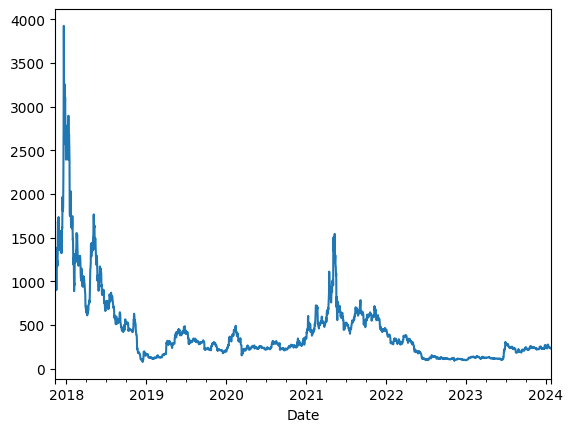

In [4]:
df_btc.close.plot()

# strategy

## definition

In [4]:
# Define the strategy logic in a function
def strategy_logic(close, window_entry_identify, window_entry_count, hh_hl_counts, 
                   window_exit_identify, window_exit_count, lh_counts):
    #close = pd.Series(close.flatten())
    if isinstance(close, np.ndarray):
        close = pd.DataFrame(close)
    higher_highs = close > close.rolling(window=window_entry_identify, min_periods=1).max().shift(1)
    higher_lows = close > close.rolling(window=window_entry_identify, min_periods=1).min().shift(1)

    hh_count = higher_highs.rolling(window=window_entry_count).sum()
    hl_count = higher_lows.rolling(window=window_entry_count).sum()

    entry_signal = (hl_count.shift(1) >= hh_hl_counts) & (hh_count.shift(1) >= hh_hl_counts) & higher_lows

    lower_highs = close < close.rolling(window=window_exit_identify, min_periods=1).max().shift(1)
    lh_count = lower_highs.rolling(window=window_exit_count).sum()
    exit_signal = (lh_count >= lh_counts) & lower_highs

    return entry_signal, exit_signal

# Create a custom indicator using the IndicatorFactory
MyStrategy = vbt.IndicatorFactory(
    input_names=['close'],
    param_names=['window_entry_identify', 'window_entry_count', 'hh_hl_counts',
                 'window_exit_identify', 'window_exit_count', 'lh_counts'],
    output_names=['entry_signal', 'exit_signal']
).from_apply_func(strategy_logic)

# Define parameter ranges
param_ranges = {
    'window_entry_identify': np.arange(3, 9),
    'window_entry_count': np.arange(3, 9),
    'hh_hl_counts': np.arange(1, 5),
    'window_exit_identify': np.arange(3, 9),
    'window_exit_count': np.arange(3, 9),
    'lh_counts': np.arange(1, 5)
}

## walk forward

In [5]:
split_kwargs = dict(n = 10,
                    window_len = 1100,
                    set_lens = (365,),
                    left_to_right = False)

figure = df_btc['close'].vbt.rolling_split(**split_kwargs,
                            plot = True)
figure.update_layout(width = 800, height = 400)
figure.show()

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/jupyter_client/session.py:721: UserWarning:

Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/jupyter_client/session.py:721: UserWarning:

Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant



In [6]:
(in_price_open, in_indexes_open), (out_price_open, out_indexes_open) = df_btc['open'].shift(-1).vbt.rolling_split(**split_kwargs)
(in_price_close, in_indexes_close), (out_price_close, out_indexes_close) = df_btc['close'].vbt.rolling_split(**split_kwargs)

print(in_price_open.shape, len(in_indexes_open))  # in-sample next day open
print(out_price_open.shape, len(out_indexes_open)) # out of sample next day open

print(in_price_close.shape, len(in_indexes_close))  # in-sample close
print(out_price_close.shape, len(out_indexes_close)) # out of sample close

(735, 10) 10
(365, 10) 10
(735, 10) 10
(365, 10) 10


## in sample portfolio

In [7]:
indicator = MyStrategy.run(in_price_close, **param_ranges, param_product = True)

# Backtest the strategy
entries = indicator.entry_signal
exits = indicator.exit_signal

pf = vbt.Portfolio.from_signals(in_price_close, 
                                entries, 
                                exits,
                                price = in_price_open,
                                fees=0.001, 
                                slippage=0.0001, 
                                freq='1D')

In [8]:
stats_wf = pf.stats(agg_func = None)
stats_wf.to_pickle('../data/bch_usd_hh_hl_wf_optimization.pickle')
del(pf)
gc.collect()

52415

In [9]:
stats_wf.columns

Index(['Start', 'End', 'Period', 'Start Value', 'End Value',
       'Total Return [%]', 'Benchmark Return [%]', 'Max Gross Exposure [%]',
       'Total Fees Paid', 'Max Drawdown [%]', 'Max Drawdown Duration',
       'Total Trades', 'Total Closed Trades', 'Total Open Trades',
       'Open Trade PnL', 'Win Rate [%]', 'Best Trade [%]', 'Worst Trade [%]',
       'Avg Winning Trade [%]', 'Avg Losing Trade [%]',
       'Avg Winning Trade Duration', 'Avg Losing Trade Duration',
       'Profit Factor', 'Expectancy', 'Sharpe Ratio', 'Calmar Ratio',
       'Omega Ratio', 'Sortino Ratio'],
      dtype='object')

In [10]:
stats_wf.index.names

FrozenList(['custom_window_entry_identify', 'custom_window_entry_count', 'custom_hh_hl_counts', 'custom_window_exit_identify', 'custom_window_exit_count', 'custom_lh_counts', 'split_idx'])

## out of sample portfolio

In [11]:
indicator = MyStrategy.run(out_price_close, **param_ranges, param_product = True)

# Backtest the strategy
entries = indicator.entry_signal
exits = indicator.exit_signal

pf = vbt.Portfolio.from_signals(out_price_close, 
                                entries, 
                                exits,
                                price = out_price_open,
                                fees=0.001, 
                                slippage=0.0001, 
                                freq='1D')

In [12]:
stats_wf_out = pf.stats(agg_func = None)
stats_wf_out.to_pickle('../data/bch_usd_hh_hl_wf_optimization_out_of_sample.pickle')
del(pf)
gc.collect()

3730

In [13]:
stats_wf_out = pd.read_pickle('../data/bch_usd_hh_hl_wf_optimization_out_of_sample.pickle')
stats_wf_out.shape # 20_736 parameter kombinacii x 10 wf period

(207360, 28)

In [14]:
stats_wf = pd.read_pickle('../data/bch_usd_hh_hl_wf_optimization.pickle')
stats_wf.shape # 20_736 parameter kombinacii x 10 wf period

(207360, 28)

## eval

### best params comparison

In [15]:
s_stats_wf_sharpe = stats_wf['Sharpe Ratio'].replace([np.inf, -np.inf], np.nan)
s_stats_wf_sharpe.dropna(inplace = True)
s_stats_wf_sharpe.groupby('split_idx').idxmax()

split_idx
0    (3, 8, 1, 4, 5, 4, 0)
1    (3, 8, 1, 3, 6, 4, 1)
2    (7, 7, 1, 4, 4, 3, 2)
3    (8, 7, 1, 5, 4, 3, 3)
4    (5, 8, 2, 4, 5, 4, 4)
5    (5, 8, 2, 4, 5, 4, 5)
6    (5, 5, 2, 5, 4, 4, 6)
7    (5, 5, 2, 5, 5, 4, 7)
8    (5, 5, 2, 5, 5, 4, 8)
9    (5, 4, 2, 3, 5, 4, 9)
Name: Sharpe Ratio, dtype: object

In [16]:
best_params_sharpe_in_sample = s_stats_wf_sharpe[s_stats_wf_sharpe.groupby('split_idx').idxmax()]
best_params_sharpe_in_sample

custom_window_entry_identify  custom_window_entry_count  custom_hh_hl_counts  custom_window_exit_identify  custom_window_exit_count  custom_lh_counts  split_idx
3                             8                          1                    4                            5                         4                 0            1.418199
                                                                              3                            6                         4                 1            1.442737
7                             7                          1                    4                            4                         3                 2            1.251227
8                             7                          1                    5                            4                         3                 3            1.087902
5                             8                          2                    4                            5                         4             

In [17]:
s_stats_wf_sharpe_out = stats_wf_out['Sharpe Ratio']
best_params_sharpe_out_of_sample = s_stats_wf_sharpe_out[s_stats_wf_sharpe.groupby('split_idx').idxmax()]
best_params_sharpe_out_of_sample

custom_window_entry_identify  custom_window_entry_count  custom_hh_hl_counts  custom_window_exit_identify  custom_window_exit_count  custom_lh_counts  split_idx
3                             8                          1                    4                            5                         4                 0            0.241884
                                                                              3                            6                         4                 1            0.707378
7                             7                          1                    4                            4                         3                 2            1.522076
8                             7                          1                    5                            4                         3                 3            1.594337
5                             8                          2                    4                            5                         4             

### scatterplot - best params

In [18]:
df_best_params_sharpe_joined = best_params_sharpe_in_sample.to_frame()\
    .join(best_params_sharpe_out_of_sample.to_frame(), lsuffix = '_in_sample', rsuffix = '_out_of_sample')
df_best_params_sharpe_joined


Sharpe Ratio_in_sample  \
custom_window_entry_identify custom_window_entry_count custom_hh_hl_counts custom_window_exit_identify custom_window_exit_count custom_lh_counts split_idx                           
3                            8                         1                   4                           5                        4                0                        1.418199   
                                                                           3                           6                        4                1                        1.442737   
7                            7                         1                   4                           4                        3                2                        1.251227   
8                            7                         1                   5                           4                        3                3                        1.087902   
5                            8                         2                   4                           5                        4                4                        1.812021   
                                                                                                                                                 5                        1.797561   
                             5                         2                   5                           4                        4                6                        1.737377   
                                                                                                       5                        4                7                        1.823090   
                                                                                                                                                 8                        1.664895   
                             4                         2                   3                           5                        4                9                        1.928516   

                                                                                                                                                            Sharpe Ratio_out_of_sample  
custom_window_entry_identify custom_window_entry_count custom_hh_hl_counts custom_window_exit_identify custom_window_exit_count custom_lh_counts split_idx                              
3                            8                         1                   4                           5                        4                0                            0.241884  
                                                                           3                           6                        4                1                            0.707378  
7                            7                         1                   4                           4                        3                2                            1.522076  
8                            7                         1                   5                           4                        3                3                            1.594337  
5                            8                         2                   4                           5                        4                4                            0.814260  
                                                                                                                                                 5                           -0.431805  
                             5                         2                   5                           4                        4                6                            0.149301  
                                                                                                       5                        4                7                            0.222938  
                                                                                                                         

In [19]:
df_plot = df_best_params_sharpe_joined.reset_index()

# Create a scatter plot with index in hover data
fig = px.scatter(df_plot, 
                 x='Sharpe Ratio_in_sample', 
                 y='Sharpe Ratio_out_of_sample', 
                 hover_data=df_plot.columns[:df_best_params_sharpe_joined.index.nlevels])

# Show the plot
fig.show()

### best params and their avg

In [20]:
best_params = s_stats_wf_sharpe.groupby('split_idx').idxmax().apply(lambda x: x[:6]).drop_duplicates().reset_index(drop = True)
s_stats_wf_sharpe_out_without_split = s_stats_wf_sharpe_out.droplevel('split_idx')
s_stats_wf_sharpe_out_without_split[best_params].groupby(level = s_stats_wf_sharpe_out_without_split.index.names).describe()


count  \
custom_window_entry_identify custom_window_entry_count custom_hh_hl_counts custom_window_exit_identify custom_window_exit_count custom_lh_counts          
3                            8                         1                   3                           6                        4                  10.0   
                                                                           4                           5                        4                  10.0   
5                            4                         2                   3                           5                        4                  10.0   
                             5                         2                   5                           4                        4                  10.0   
                                                                                                       5                        4                  10.0   
                             8                         2                   4                           5                        4                  10.0   
7                            7                         1                   4                           4                        3                  10.0   
8                            7                         1                   5                           4                        3                  10.0   

                                                                                                                                                      mean  \
custom_window_entry_identify custom_window_entry_count custom_hh_hl_counts custom_window_exit_identify custom_window_exit_count custom_lh_counts             
3                            8                         1                   3                           6                        4                 0.378072   
                                                                           4                           5                        4                 0.318522   
5                            4                         2                   3                           5                        4                 1.067629   
                             5                         2                   5                           4                        4                 1.170558   
                                                                                                       5                        4                 1.048737   
                             8                         2                   4                           5                        4                 0.812448   
7                            7                         1                   4                           4                        3                 0.557076   
8                            7                         1                   5                           4                        3                 0.494215   

                                                                                                                                                       std  \
custom_window_entry_identify custom_window_entry_count custom_hh_hl_counts custom_window_exit_identify custom_window_exit_count custom_lh_counts             
3                            8                         1                   3                           6                        4                 0.891179   
                                                                           4                           5                        4                 1.048307   
5                            4                         2                   3                           5                        4                 0.745542   
                             5                         2                   5                           4                        4                 0.796533   
                                                                  

### scatterplot - all params

In [21]:
stats_wf_joined = stats_wf.join(stats_wf_out, lsuffix = '_in_sample', rsuffix='_out_of_sample')
df_plot = stats_wf_joined.reset_index()
fig = px.density_heatmap(df_plot, x='Sharpe Ratio_in_sample', y='Sharpe Ratio_out_of_sample', nbinsx=200, nbinsy=200,
                         width = 700, height = 600)

# Show the plot
fig.show()


## whole eval df

In [22]:
def rank_strategies(df, metric):
    ranks = df.groupby('split_idx')[metric].rank(method='min', ascending=False).astype(int)
    return df.assign(Rank=ranks)

columns_to_describe = ['Total Return [%]', 'Max Drawdown [%]', 'Max Drawdown Duration', 'Total Trades', 'Win Rate [%]', 'Sharpe Ratio', 'Rank']
ranking_metric = 'Sharpe Ratio'

in_sample_df = rank_strategies(stats_wf, ranking_metric)
out_of_sample_df = rank_strategies(stats_wf_out, ranking_metric)


    

In [23]:
# Calculate the percentage difference between in-sample and out-of-sample dataframes
pct_diff_df = (out_of_sample_df[columns_to_describe] - in_sample_df[columns_to_describe]) / in_sample_df[columns_to_describe].abs()
pct_diff_df.columns = [f'{col}_pct_diff' for col in pct_diff_df.columns]



In [24]:
# calculating this cell takes ~ 10 mins

in_sample_df = in_sample_df.droplevel('split_idx')
out_of_sample_df = out_of_sample_df.droplevel('split_idx')
pct_diff_df = pct_diff_df.droplevel('split_idx')

stats_in_sample_df = in_sample_df.groupby(level=in_sample_df.index.names)[columns_to_describe].describe()
stats_out_of_sample_df = out_of_sample_df.groupby(level=out_of_sample_df.index.names)[columns_to_describe].describe()
stats_pct_diff_df = pct_diff_df.groupby(level=pct_diff_df.index.names).describe()

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/pandas/core/nanops.py:1010: RuntimeWarning:

invalid value encountered in subtract

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning:

invalid value encountered in subtract

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/pandas/core/nanops.py:1010: RuntimeWarning:

invalid value encountered in subtract

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning:

invalid value encountered in subtract

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/pandas/core/nanops.py:1010: RuntimeWarning:

invalid value encountered in subtract

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/numpy/lib/function_base.py:4527: RuntimeWarning:

invalid value encountered in subtract

/home/jk/miniforge3/envs/py310_calpha/lib/python3.10/site-packages/pandas/core/

In [25]:
# Combine the original DataFrames with the percentage difference DataFrame
combined_df = stats_in_sample_df.join(stats_out_of_sample_df, lsuffix = '_in', rsuffix = '_out').join(stats_pct_diff_df)


In [26]:
combined_df.to_pickle('../data/bch_usd_combined_df.pickle')
combined_df.to_csv('../data/bch_usd_combined_df.csv', index = True, header = True)

In [27]:
combined_df = pd.read_pickle('../data/bch_usd_combined_df.pickle')
combined_df.columns = combined_df.columns.map('_'.join)
combined_df.reset_index(inplace=True)

In [28]:
combined_df.head()

,custom_window_entry_identify,custom_window_entry_count,custom_hh_hl_counts,custom_window_exit_identify,custom_window_exit_count,custom_lh_counts,Total Return [%]_in_count,Total Return [%]_in_mean,Total Return [%]_in_std,Total Return [%]_in_min,...,Sharpe Ratio_pct_diff_75%,Sharpe Ratio_pct_diff_max,Rank_pct_diff_count,Rank_pct_diff_mean,Rank_pct_diff_std,Rank_pct_diff_min,Rank_pct_diff_25%,Rank_pct_diff_50%,Rank_pct_diff_75%,Rank_pct_diff_max
0,3,3,1,3,3,1,10.0,-18.320173,27.741107,-55.896681,...,2.965491,6.589398,10.0,0.109972,0.696588,-0.931342,-0.426206,0.095166,0.612362,1.112198
1,3,3,1,3,3,2,10.0,12.347333,36.013810,-42.053242,...,1.979658,52.496079,10.0,0.090505,0.605123,-0.914165,-0.284326,0.035756,0.463415,1.242880
2,3,3,1,3,3,3,10.0,88.281945,129.919925,-44.677179,...,3.249879,79.483066,10.0,0.580039,1.305169,-0.687557,-0.426146,0.094715,1.740822,2.760194
3,3,3,1,3,3,4,10.0,21.476985,104.996098,-79.893019,...,4.322248,76.250872,10.0,1.753364,4.383482,-0.931906,-0.563027,0.357564,1.448518,13.676282
4,3,3,1,3,4,1,10.0,-18.320173,27.741107,-55.896681,...,2.965491,6.589398,10.0,0.109972,0.696588,-0.931342,-0.426206,0.095166,0.612362,1.112198


In [29]:
combined_df.to_pickle('../data/bch_usd_combined_df_1_level_cols.pickle')
combined_df.to_csv('../data/bch_usd_combined_df_1_level_cols.csv', header = True, index = False)